In [1]:
import sys, os
sys.path.insert(0,"/dartfs-hpc/rc/home/w/f003k8w/.local/lib/python3.7/site-packages/")

In [2]:
from pathflowai.utils import load_sql_df

nonechucks may not work properly with this version of PyTorch (1.6.0). It has only been tested on PyTorch versions 1.0, 1.1, and 1.2


In [3]:
df=load_sql_df("complete/patch_info_new.db",256)

In [4]:
from sklearn.neighbors import NearestNeighbors
graphs=df.groupby(['ID'])[["x","y"]].apply(lambda x: NearestNeighbors(radius=256,n_jobs=25).fit(x.values).radius_neighbors_graph(x.values))

In [5]:
import scipy.sparse as sps
components=graphs.apply(lambda x: sps.csgraph.connected_components(x)[1])

In [6]:
from collections import Counter


In [7]:
import pandas as pd
df['y_true']=df['annotation'].apply(lambda x: "Incomplete" in x)#Incomplete_Area
point_clouds=[]
for name,dff in df.groupby(['ID']):
    xy=dff[["x","y",'y_true']]
    xy['components']=components.loc[name]
    for name2, xy2 in xy.groupby('components'):
        if xy2.shape[0]>300:
            point_clouds.append((name,name2,(xy2['y_true']>0).mean()>0,xy2[['x','y']].values))
            
point_clouds=pd.DataFrame(point_clouds,columns=['slide','component','incomplete','points'])

/home/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:6: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [51]:
# n_clouds=1
X=point_clouds['points'].tolist()#[:n_clouds]

In [12]:
import copy
import numpy as np
import open3d as o3
from probreg import cpd

# load source and target point cloud
source = o3.io.read_point_cloud('bunny.pcd')
target = copy.deepcopy(source)
# transform target point cloud
th = np.deg2rad(30.0)
target.transform(np.array([[np.cos(th), -np.sin(th), 0.0, 0.0],
                           [np.sin(th), np.cos(th), 0.0, 0.0],
                           [0.0, 0.0, 1.0, 0.0],
                           [0.0, 0.0, 0.0, 1.0]]))
source = source.voxel_down_sample(voxel_size=0.005)
target = target.voxel_down_sample(voxel_size=0.005)

# compute cpd registration
tf_param, _, _ = cpd.registration_cpd(source, target)
result = copy.deepcopy(source)
result.points = tf_param.transform(result.points)

# draw result
source.paint_uniform_color([1, 0, 0])
target.paint_uniform_color([0, 1, 0])
result.paint_uniform_color([0, 0, 1])
o3.visualization.draw_geometries([source, target, result])

/bin/sh: 1: module: not found


In [63]:
point_clouds['patient']=point_clouds['slide'].map(lambda x: x.split("_")[0])

In [79]:
point_clouds['patient'].value_counts()

41     17
85     16
46     13
44     13
89     12
66     12
60     12
37     10
102    10
153     9
151     8
48      7
155     6
90      6
62      6
11      6
43      6
3       6
108     5
53      4
9       4
47      4
5       4
78      3
36      2
105     2
91      2
52      2
Name: patient, dtype: int64

SyntaxError: invalid syntax (<ipython-input-89-dd3dbde4c715>, line 1)

In [91]:
pt="41"
X_new=[X[i] for i in np.where(point_clouds['patient']==pt)[0].tolist()]
ids=(point_clouds['slide']+"_"+point_clouds['component'].astype(str)).loc[point_clouds['patient']==pt]

In [81]:
len(X_new)

17

In [92]:
from gtda.homology import VietorisRipsPersistence
from gtda.diagrams import PersistenceEntropy, PersistenceImage

import numpy as np

from gtda.pipeline import Pipeline
from sklearn.linear_model import LogisticRegression

from gtda.plotting import plot_diagram, plot_point_cloud, plot_heatmap

homology_dimensions = (0, 1, 2)
VR = VietorisRipsPersistence(
    metric='euclidean', max_edge_length=2000, homology_dimensions=homology_dimensions, n_jobs=20)

diagrams = VR.fit_transform(X_new)

PE = PersistenceImage()
X_train = PE.fit_transform(diagrams)

PE = PersistenceEntropy()
X_train0 = PE.fit_transform(diagrams)

import seaborn as sns, pandas as pd
import matplotlib
matplotlib.rcParams['figure.dpi']=300
sns.set(font_scale=0.6)
from sklearn.metrics import pairwise_distances
# ids=(point_clouds['slide']+"_"+point_clouds['component'].astype(str)).values[:n_clouds]
current_palette = sns.color_palette()
# colors=pd.DataFrame(point_clouds['incomplete'].map(lambda x: current_palette[int(x)]).values[:n_clouds],index=ids)


In [104]:
from sklearn.cluster import AgglomerativeClustering
c=AgglomerativeClustering(n_clusters=4).fit_predict(X_train0) # maybe pick most representative to map

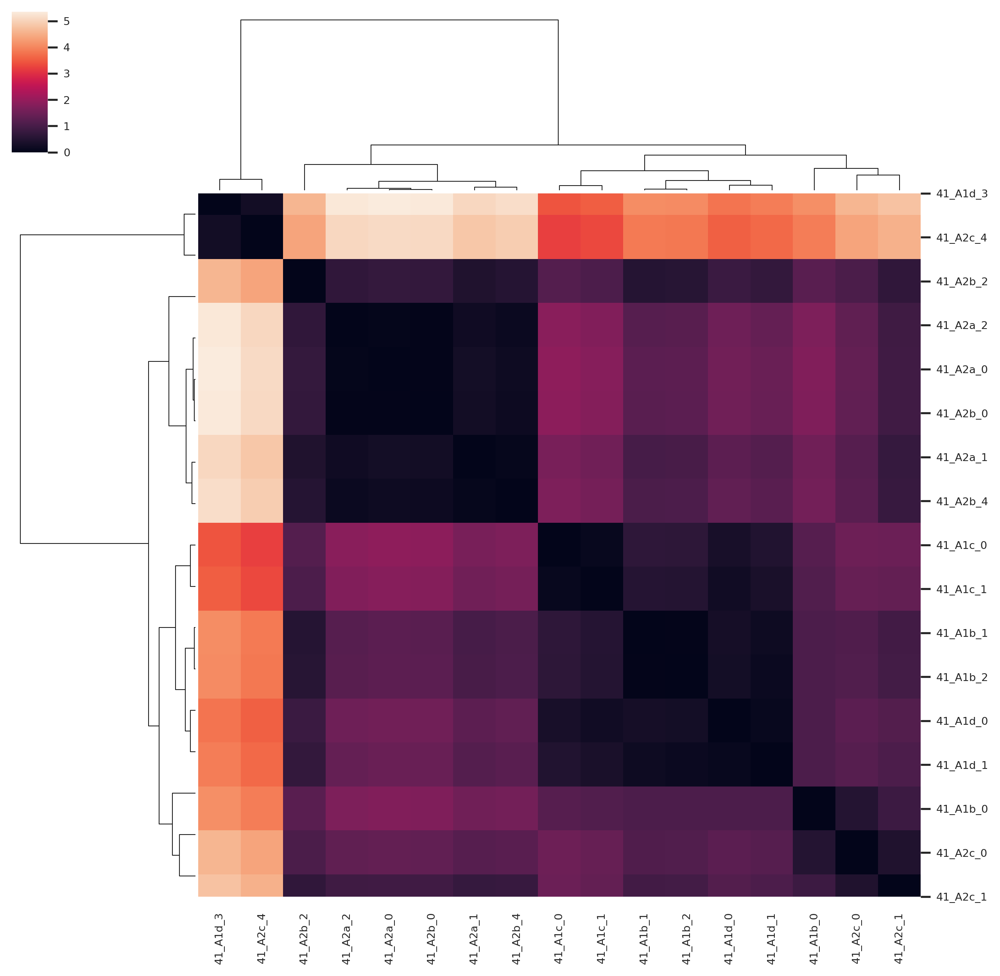

In [105]:
sns.clustermap(pd.DataFrame(pairwise_distances(X_train0),columns=ids,index=ids))#,row_colors=colors)
# threshold on shape similarity


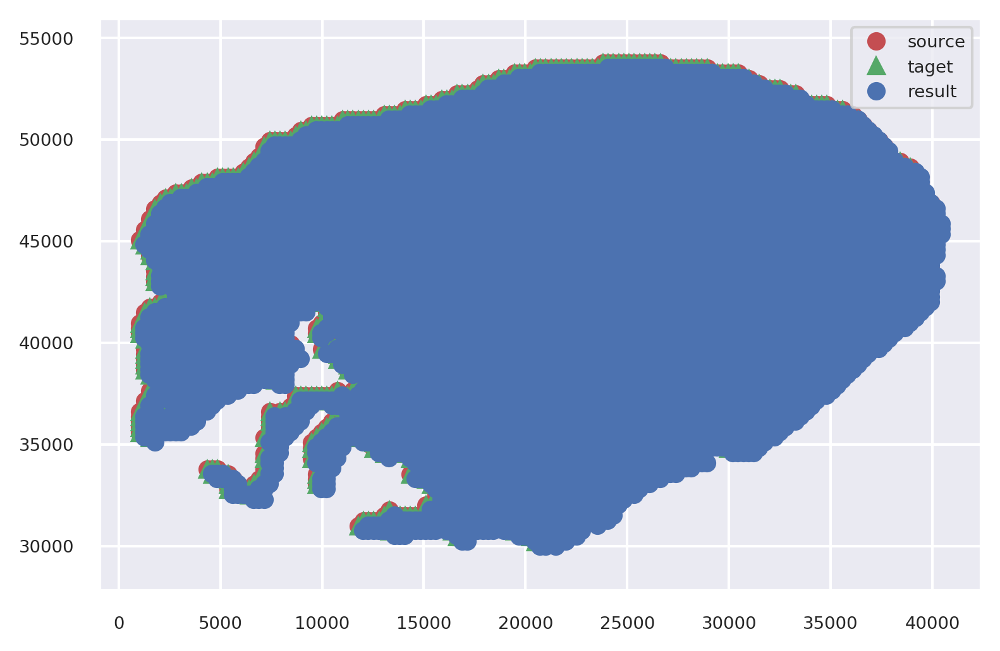

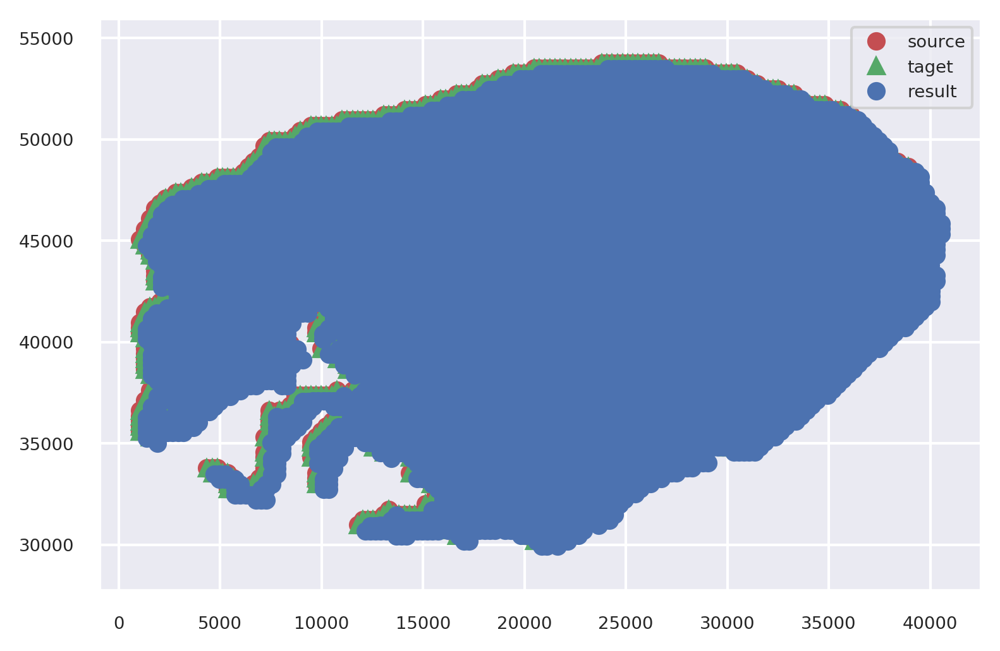

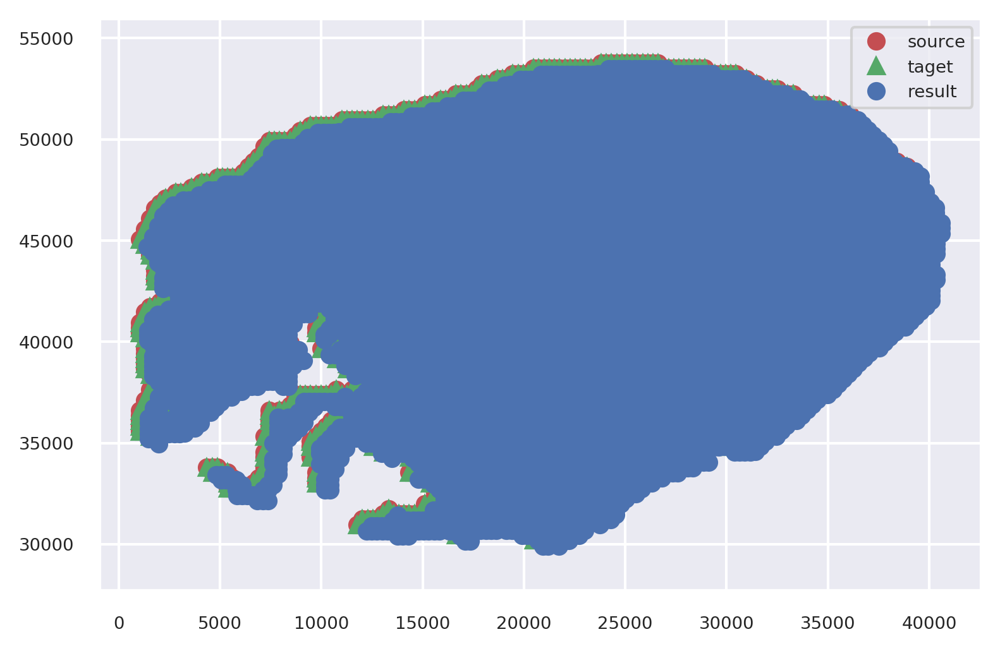

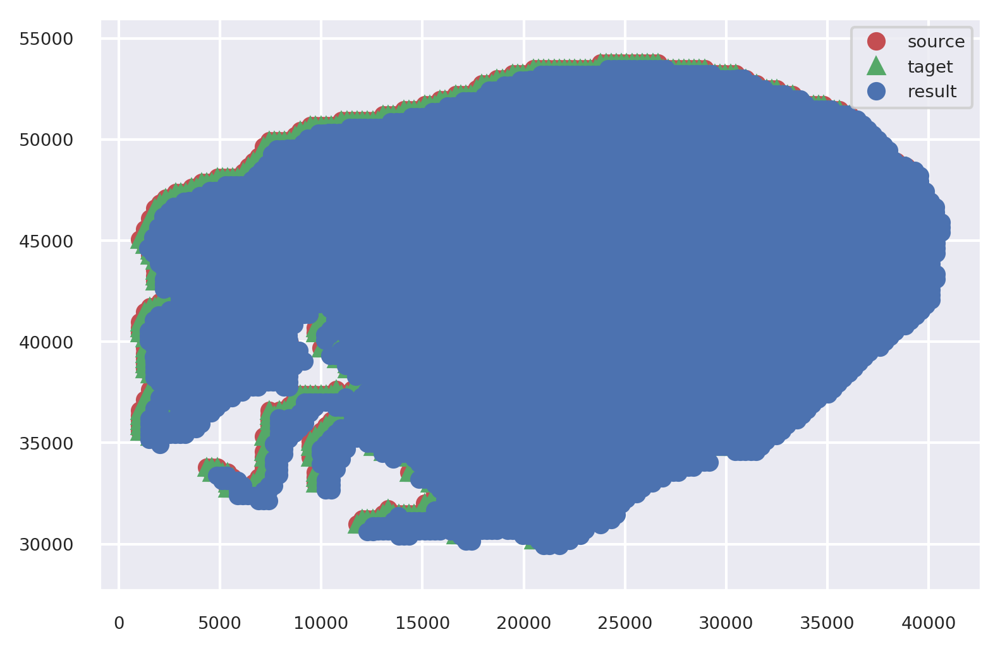

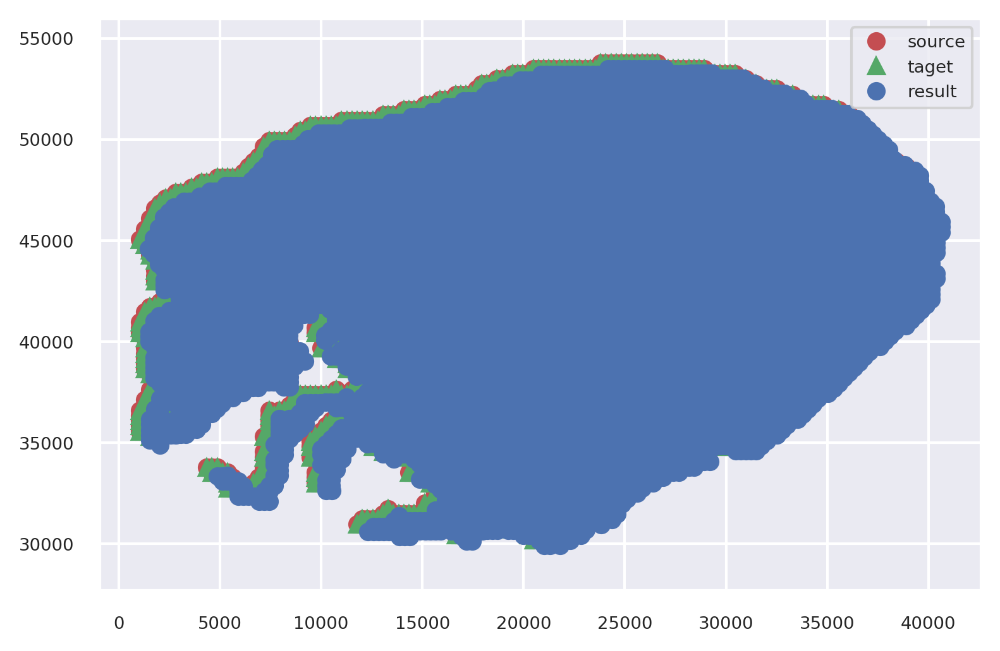

...

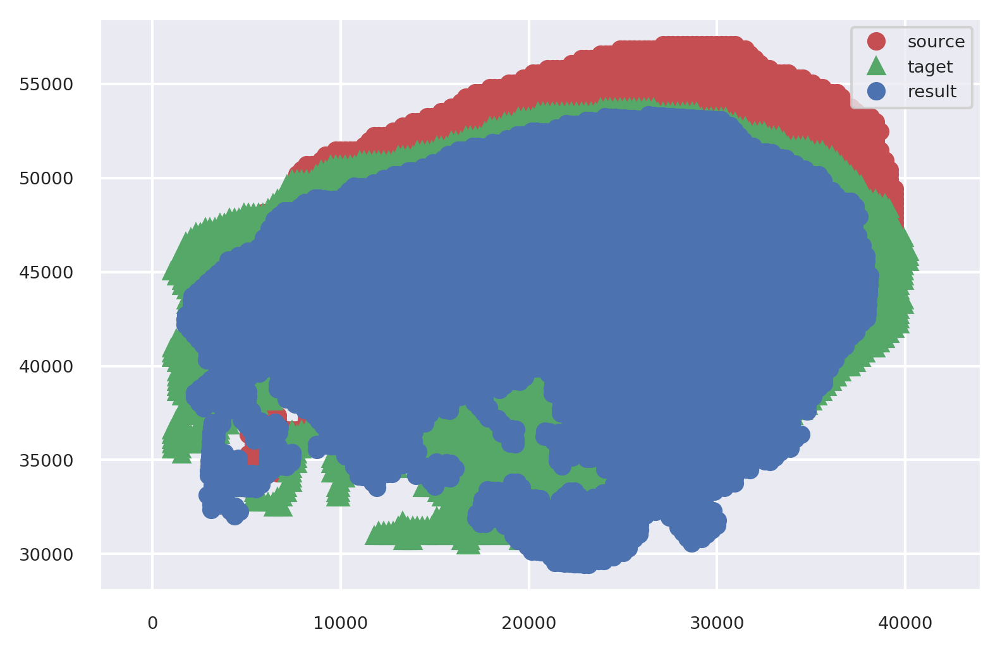

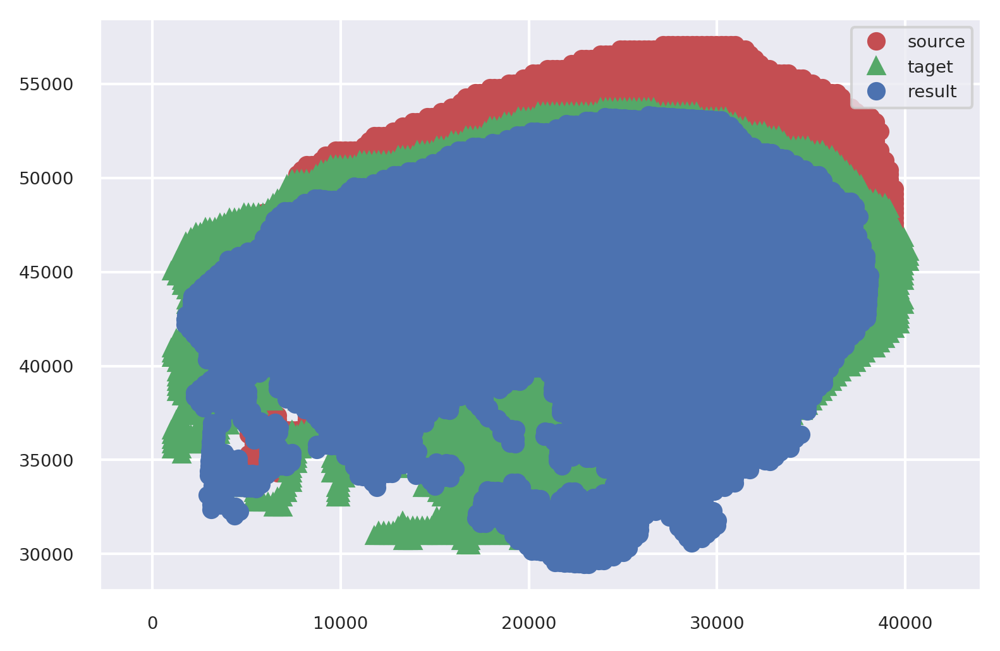

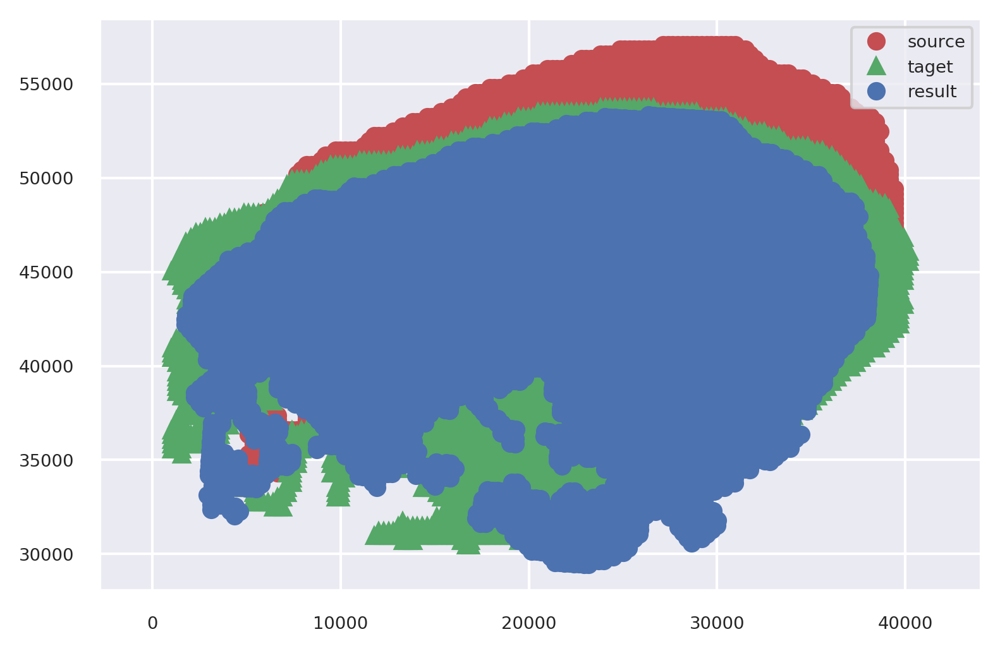

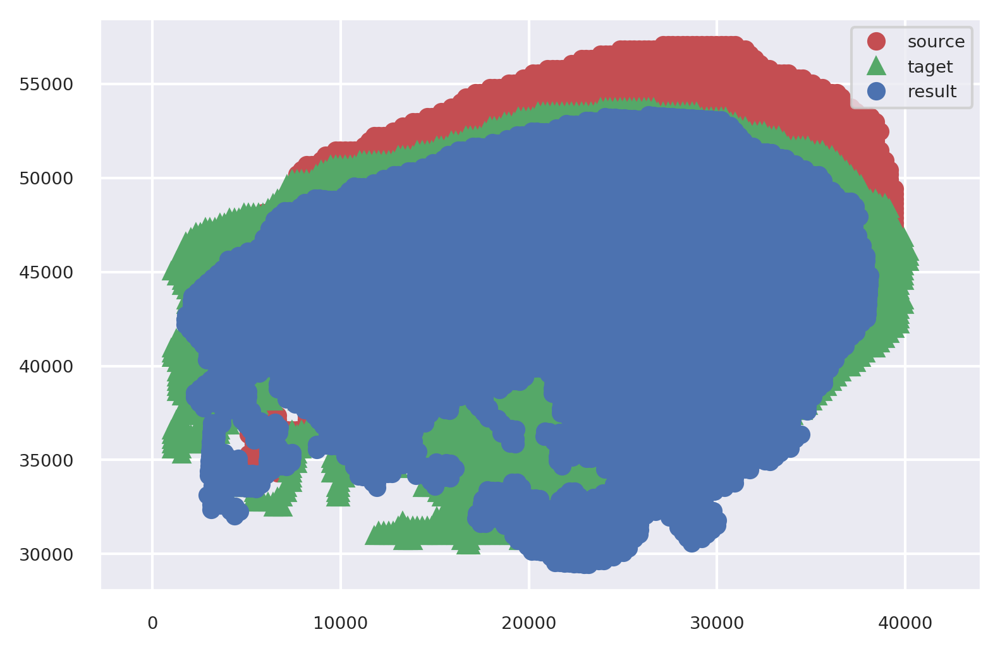

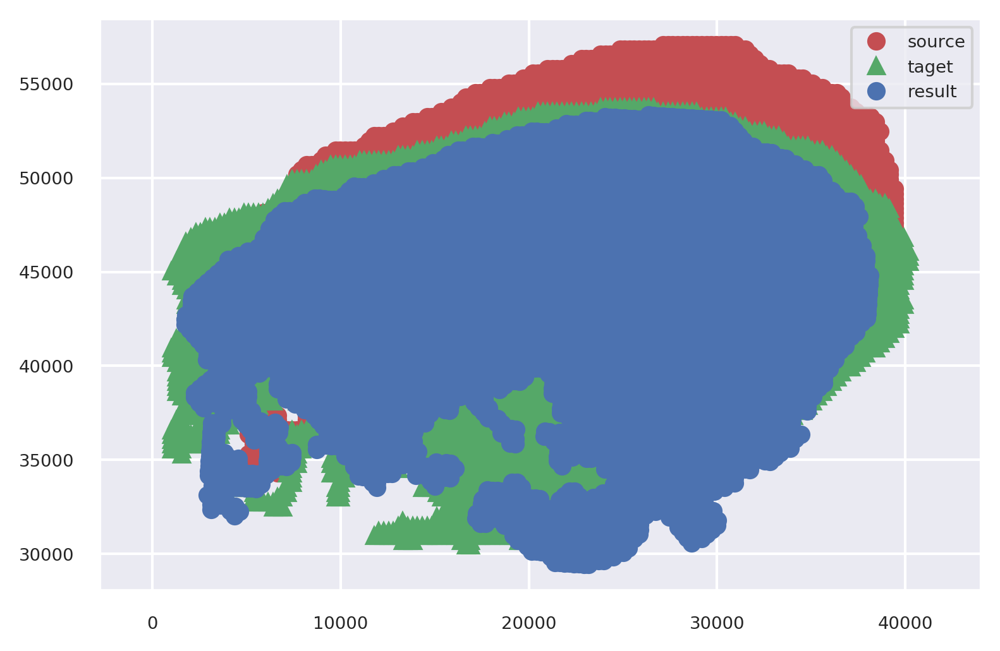

In [106]:
from probreg import filterreg
from probreg import callbacks
import matplotlib.pyplot as plt
# import utils
# shape matching within patiient then sequential
import numpy as np
# add features
X_new2=[X_new[i] for i in np.where(c==0)[0]]
for i in range(1,len(X_new2)):
    source, target = X_new2[i],X_new2[0]#-X[0].max(0)-X[1].max(0)
    cbs = [callbacks.Plot2DCallback(source, target)]
    tf_param, _, _ = filterreg.registration_filterreg(source, target, # feature_fn
                                                  objective_type="pt2pt",
                                                  callbacks=cbs,
                                                  maxiter=100,
                                                  tf_init_params={"rot": np.identity(2), "t": np.zeros(2)})

In [ ]:
# add feature alignment and airlab, maybe most important part is getting tumor to line up
# https://arxiv.org/pdf/2003.01352.pdf
# https://giotto-ai.github.io/gtda-docs/latest/notebooks/lorenz_attractor.html?highlight=wasserstein#takens-embedding

In [113]:
from gtda.time_series import Resampler, TakensEmbedding, SlidingWindow, PermutationEntropy
from gtda.homology import VietorisRipsPersistence
from gtda.diagrams import Scaler, Filtering, PersistenceEntropy, BettiCurve, PairwiseDistance
from gtda.graphs import KNeighborsGraph, GraphGeodesicDistance

from gtda.pipeline import Pipeline

import numpy as np
from sklearn.metrics import pairwise_distances

import plotly.express as px
from plotly.offline import init_notebook_mode, iplot
init_notebook_mode(connected=True)

# gtda plotting functions
from gtda.plotting import plot_heatmap
from gtda.plotting import plot_diagram, plot_betti_surfaces
from gtda.plotting import plot_point_cloud

diagrams2=[diagrams[i] for i in np.where(c==0)[0]]

window_number=3

BC = BettiCurve()

X_betti_curves = BC.fit_transform(diagrams2)

BC.plot(X_betti_curves, sample=window_number)


In [ ]:
p_W = 2
PD = PairwiseDistance(
    metric='wasserstein', metric_params={'p': p_W, 'delta': 0.1}, order=None)

X_distance_W = PD.fit_transform(diagrams2)

plot_heatmap(X_distance_W[:, :, 0], colorscale='blues')


In [21]:
tf_param.rot

array([[ 0.96175216,  0.27392133],
       [-0.27392133,  0.96175216]])

In [45]:
np.random.randn(2,2)

array([[-1.28378079,  0.63957527],
       [-0.78509901,  1.69431793]])

In [ ]:
# maybe match deep features sometime